### Score: `[53]`

Q1. `[4+5.5+5]` Godd job! 1.1注意ppb

Q2. `[11+11]` Great job!

Q3. `[5.5+11]` Very good job!

各题批注用`### Note`给出，请自行查阅。

In [15]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import detrend
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cftime
from scipy import interpolate
import hvplot.xarray
import seaborn as sns
from scipy.stats import pearsonr
import hvplot.pandas

In [16]:
# Load the data
ds = xr.open_dataset('200301_202006-C3S-L3_GHG-PRODUCTS-OBS4MIPS-MERGED-v4.3.nc')
print(ds.head())
# Extract methane (xch4) data, latitude, longitude, and time
xch4 = ds['xch4'] # Methane levels in ppb
lat = ds['lat'] # Latitude
lon = ds['lon'] # Longitude
time = ds['time']

<xarray.Dataset>
Dimensions:                  (time: 5, bnds: 2, lat: 5, lon: 5, pressure: 5)
Coordinates:
  * time                     (time) datetime64[ns] 2003-01-16T12:00:00 ... 20...
  * lat                      (lat) float64 -87.5 -82.5 -77.5 -72.5 -67.5
  * lon                      (lon) float64 -177.5 -172.5 -167.5 -162.5 -157.5
Dimensions without coordinates: bnds, pressure
Data variables:
    time_bnds                (time, bnds) datetime64[ns] ...
    lat_bnds                 (lat, bnds) float64 ...
    lon_bnds                 (lon, bnds) float64 ...
    pre                      (pressure) float64 ...
    pre_bnds                 (pressure, bnds) float64 ...
    land_fraction            (lat, lon) float64 ...
    xch4                     (time, lat, lon) float32 ...
    xch4_nobs                (time, lat, lon) float64 ...
    xch4_stderr              (time, lat, lon) float32 ...
    xch4_stddev              (time, lat, lon) float32 ...
    column_averaging_kernel  (time, p

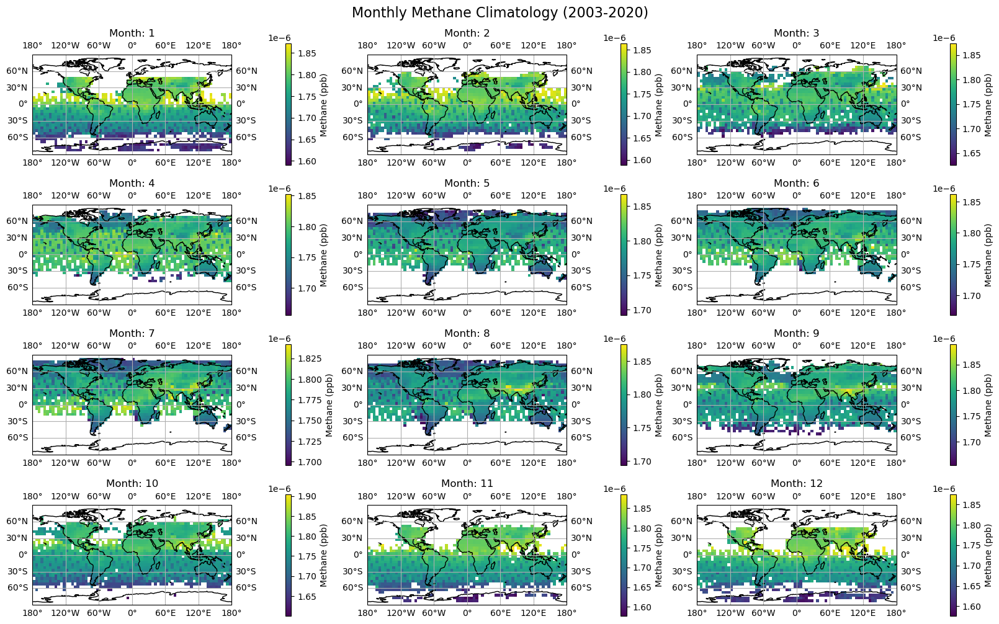

In [17]:
# 1. Compute methane climatology for each month
# Group by month and calculate the mean for each month across all years
xch4_monthly_climatology = xch4.groupby('time.month').mean('time')
# Plot the monthly climatology in 12 panels
fig, axs = plt.subplots(4, 3, figsize=(16, 10), constrained_layout=True, 
                        subplot_kw={'projection': ccrs.PlateCarree()})
fig.suptitle('Monthly Methane Climatology (2003-2020)', fontsize=16)

for i, ax in enumerate(axs.flat):
    pcm = ax.pcolormesh(lon, lat, xch4_monthly_climatology[i, :, :], cmap='viridis', shading='auto')
    
    ax.set_title(f'Month: {i + 1}')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    # Add coastlines and gridlines
    ax.coastlines()
    ax.gridlines(draw_labels=True)
    
    # Add a colorbar
    fig.colorbar(pcm, ax=ax, orientation='vertical', label='Methane (ppb)')
    ### Note: 纵坐标如果要标ppb的话，数值要乘以10^9，以下同理

plt.show()

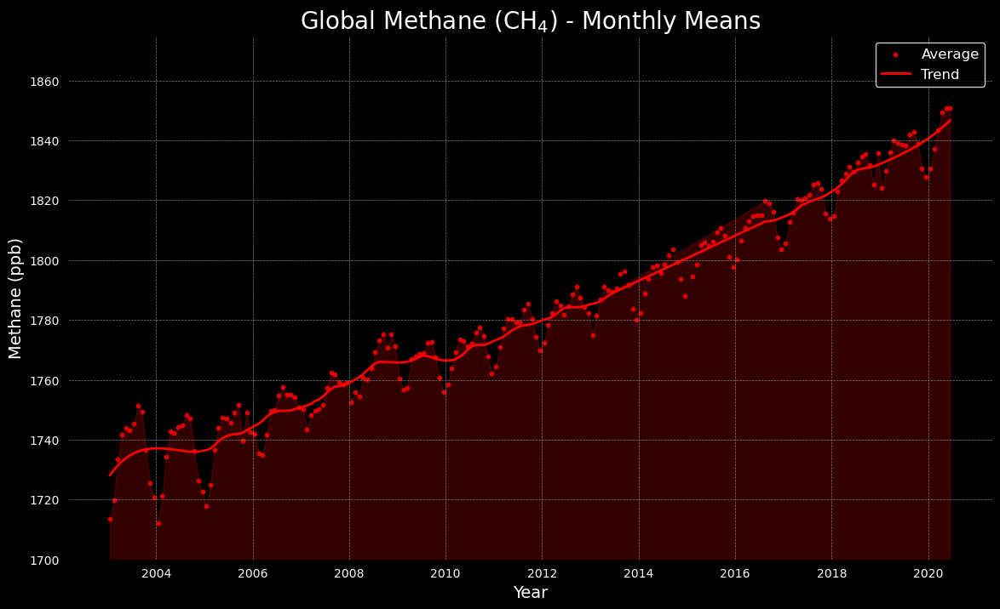

In [18]:
# 2. Plot globally-averaged methane from 2003-01 to 2020-06
from scipy.signal import savgol_filter  # Used to smooth trend lines

# Calculate global mean methane concentrations
weights = np.cos(np.deg2rad(lat))  # Calculate area weights based on latitude
weights /= weights.sum()  # # Normalize the weights (sum should equal 1)

# Compute global mean
global_avg_methane = xch4.weighted(weights).mean(dim=['lat', 'lon'])
# Smooth data using Savitzky-Golay filter
smoothed_methane = savgol_filter(global_avg_methane, window_length=37, polyorder=3)

# Scale factor to convert methane concentration to ppb
scale_factor = 1e9 

# Convert global_avg_methane and smoothed_methane to ppb
global_avg_methane_ppb = global_avg_methane * scale_factor
smoothed_methane_ppb = smoothed_methane * scale_factor

# Plot
plt.figure(figsize=(14, 8), facecolor='black')
ax = plt.gca()
ax.set_facecolor('black')

# Scatter plot of methane concentrations (converted to ppb)
plt.scatter(time, global_avg_methane_ppb, color='red', s=10, label='Average', alpha=0.8)

# Draw trendlines and avoid breaks caused by NaN values
valid_indices = ~np.isnan(smoothed_methane_ppb)
plt.plot(time[valid_indices], smoothed_methane_ppb[valid_indices], color='red', linewidth=2, label='Trend')

# Fill the bottom area under the curve
plt.fill_between(time[valid_indices], global_avg_methane_ppb[valid_indices], 1700, color='red', alpha=0.2)

# Set the title and axis labels
plt.title('Global Methane (CH$_4$) - Monthly Means', color='white', fontsize=20)
plt.xlabel('Year', color='white', fontsize=14)
plt.ylabel('Methane (ppb)', color='white', fontsize=14)

# Set the Y-axis range and scale
plt.ylim(1700, 1875)
plt.yticks(color='white')
plt.xticks(color='white')
plt.legend(facecolor='black', edgecolor='white', fontsize=12, labelcolor='white')
plt.grid(color='gray', linestyle='--', linewidth=0.5)

plt.show()
# Globally-averaged methane from 2003-01 to 2020-06 sustained growth, and the growth trend from 2010 to 2014 was relatively slow, 
# while the growth trend from 2018 to 2020 was relatively rapid.

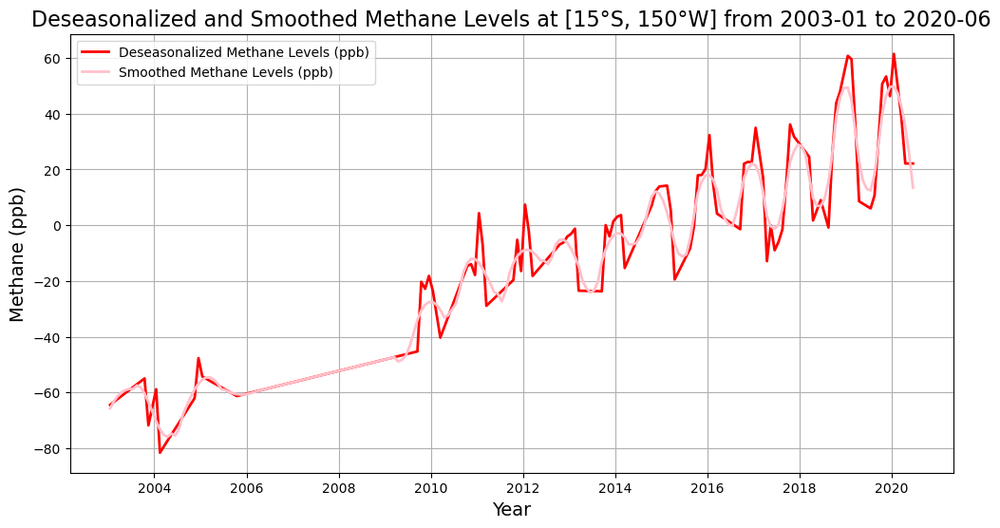

In [19]:
# 3. Extract methane levels at point [15°S, 150°W]
# Convert coordinates to the index values in the dataset
lat_idx = np.abs(lat - (-15)).argmin()  # Find the closest index to 15°S
lon_idx = np.abs(lon - (-150)).argmin()  # Find the closest index to 150°W

# Extract time series at this location
methane_series = xch4[:, lat_idx, lon_idx]

# Convert methane series to ppb
scale_factor = 1e9  # Conversion factor from mol/mol to ppb
methane_series_ppb = methane_series * scale_factor

# Detrend the methane series by removing the seasonal cycle
# Compute monthly climatology
monthly_climatology_ppb = methane_series_ppb.groupby('time.month').mean('time')

# Deseasonalize the series
deseasonalized_series_ppb = methane_series_ppb.groupby('time.month') - monthly_climatology_ppb

# Handling NaN values: Fill NaN with linear interpolation
deseasonalized_series_values_ppb = deseasonalized_series_ppb.values
nans, x = np.isnan(deseasonalized_series_values_ppb), lambda z: z.nonzero()[0]
deseasonalized_series_values_ppb[nans] = np.interp(
    x(nans), x(~nans), deseasonalized_series_values_ppb[~nans]
)

# Smooth the deseasonalized series using Savitzky-Golay filter
window_length = 13  # Window size
polyorder = 3       # Polynomial order
smoothed_series_ppb = savgol_filter(
    deseasonalized_series_values_ppb, window_length=window_length, polyorder=polyorder, mode='interp'
)

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(time, deseasonalized_series_values_ppb, color='red', label='Deseasonalized Methane Levels (ppb)', linewidth=2)
plt.plot(time, smoothed_series_ppb, color='#FFC0CB', linestyle='-', linewidth=2, label='Smoothed Methane Levels (ppb)')
plt.xlabel('Year', fontsize=14)
plt.ylabel('Methane (ppb)', fontsize=14)
plt.title('Deseasonalized and Smoothed Methane Levels at [15°S, 150°W] from 2003-01 to 2020-06', fontsize=16)
plt.grid(True)
plt.legend()
plt.show()

# Description of results
# The deseasonalized time series shows the variation in methane levels at [15°S, 150°W] without the influence of the annual seasonal cycle.

In [20]:
# 2. Niño 3.4 index
# Load the SST data from the netCDF file
data = xr.open_dataset('NOAA_NCDC_ERSST_v3b_SST.nc')

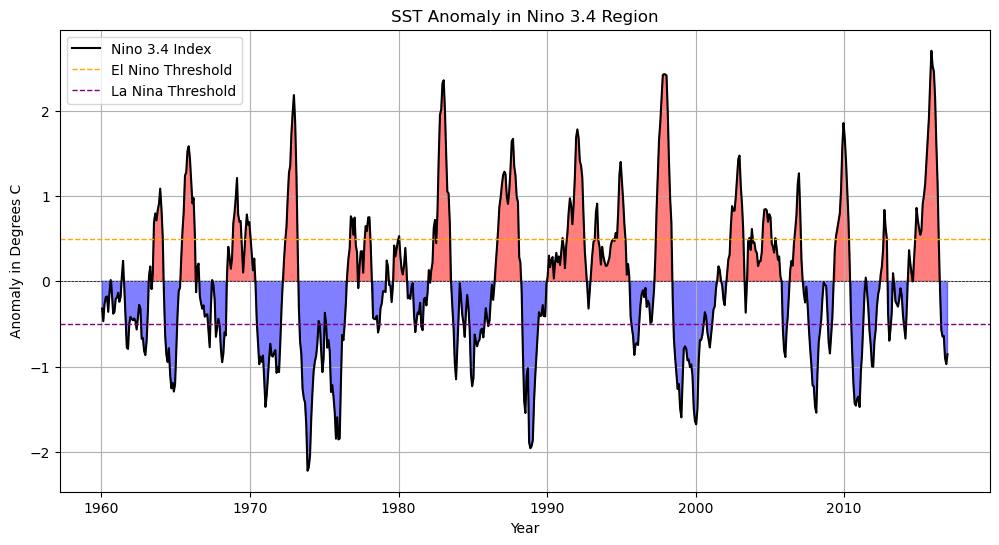

In [21]:
# Define the Niño 3.4 region
lat_bounds = [-5, 5]
lon_bounds = [190, 240] #120w-170w=190e-240e

# Subset the data to the Niño 3.4 region
sst = data['sst'].sel(lat=slice(*lat_bounds), lon=slice(*lon_bounds))

# Calculate monthly climatology (mean over all years for each month)
climatology = sst.groupby('time.month').mean(dim='time')

# Compute anomalies by subtracting climatology
sst_anomalies = sst.groupby('time.month') - climatology

# Area-averaged anomalies over the Niño 3.4 region
nino34_index = sst_anomalies.mean(dim=['lat', 'lon'])

# Plotting the Niño 3.4 Index
plt.figure(figsize=(12, 6))
plt.plot(nino34_index['time'], nino34_index, label='Nino 3.4 Index', color='black')
# Fill parts greater than 0 in red and parts less than 0 in blue
plt.fill_between(
    nino34_index['time'], 
    nino34_index, 
    where=(nino34_index > 0), 
    color='red', 
    alpha=0.5
)
plt.fill_between(
    nino34_index['time'], 
    nino34_index, 
    where=(nino34_index < 0), 
    color='blue', 
    alpha=0.5
)

# Add a threshold line
plt.axhline(0.5, color='orange', linestyle='--', linewidth=1, label='El Nino Threshold')
plt.axhline(-0.5, color='purple', linestyle='--', linewidth=1, label='La Nina Threshold')

    
# Add labels and legends
plt.axhline(0, color='k', linestyle='--', linewidth=0.5)
plt.xlabel('Year')
plt.ylabel('Anomaly in Degrees C')
plt.title('SST Anomaly in Nino 3.4 Region')
plt.legend()
plt.grid()
plt.show()

In [22]:
# 3. Explore a netCDF dataset
# data: https://send.cra.moe/file/yM0FbSl84I3EdXkN/EzmZ0S2GfXXO394A/Carbon%20Monitoring.zip

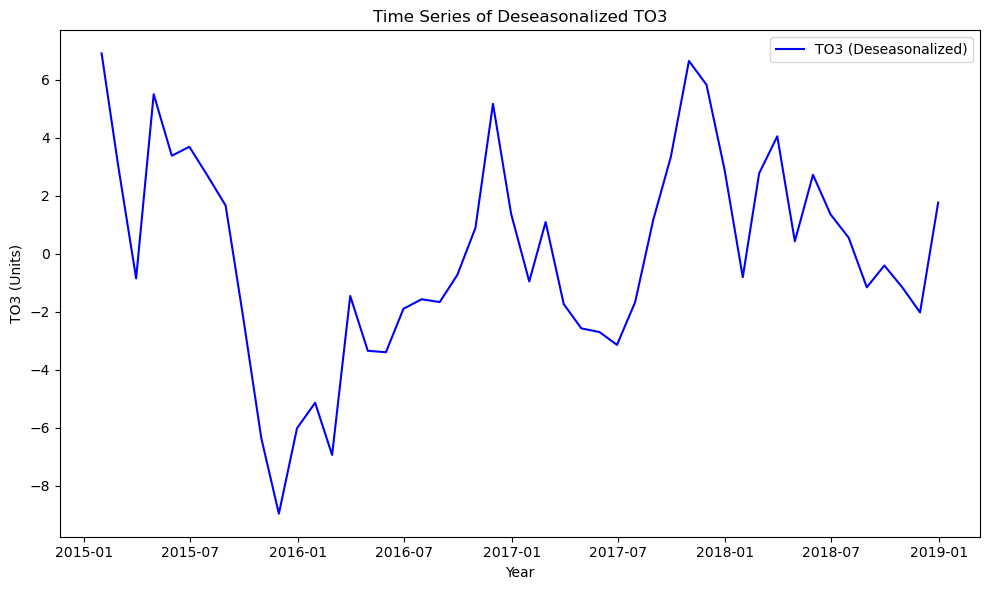

In [23]:
# 1. Read and merge MERRA-2 data from 2015-2018
def read_and_merge_nc_merra2():
    file_paths = [f'MERRA2_400.tavgM_2d_chm_Nx.{year}{month:02d}.nc4' for year in range(2015, 2019) for month in range(1, 13)]
    datasets = []

    for file in file_paths:
        ds = xr.open_dataset(file)
        
        # Check whether the time type is cftime
        if isinstance(ds['time'].values[0], cftime.DatetimeNoLeap):
            # Convert cftime to datetime64
            ds['time'] = ds.indexes['time'].to_datetimeindex()
        
        datasets.append(ds)
    
    # Merge all data sets by time dimension
    merged_ds = xr.concat(datasets, dim="time")
    return merged_ds

# Call functions to read and merge data
ds_merra2 = read_and_merge_nc_merra2()

# Extracts a list of available variables
def get_available_variables(ds):
    return list(ds.data_vars)

# 3. Removes the monthly seasonal cycle for a variable
def remove_monthly_seasonal_cycle(ds, variable):
    df = ds[variable].to_dataframe().reset_index()
    df['date'] = pd.to_datetime(df['time'])
    df.set_index('date', inplace=True)
    
    # Calculate the monthly average and remove
    monthly_avg = df.groupby(df.index.month).mean()
    df['deseasonalized'] = df[variable] - df.index.month.map(monthly_avg[variable])
    
    return df

# A list of selected variables
# COCL：CO Column Burden，COEM：CO Emission，COLS：CO Chemical Loss，COPD：CO Chemical Production，COSC：CO Surface Concentration in ppbv，LWI：land(1) water(0) ice(2) flag，TO3：total column ozone
variables = ['TO3']  

# 4. Plot a time series without seasonal cycles
plt.figure(figsize=(10, 6))

# Iterate over each variable and plot the seasonally-removed time series
for i, variable in enumerate(variables, 1):
    
    # Remove seasonal cycles
    df = remove_monthly_seasonal_cycle(ds_merra2, variable)
    
    # Aggregate the data monthly and take the average for each month
    df_monthly = df.resample('M').mean()
    
    # Create subgraph
    plt.subplot(len(variables), 1, i)
    plt.plot(df_monthly.index, df_monthly['deseasonalized'], label=f'{variable} (Deseasonalized)', color='blue')  # Draw a line chart
    plt.title(f'Time Series of Deseasonalized {variable}')
    plt.xlabel('Year')
    plt.ylabel(f'{variable} (Units)')
    plt.legend(loc='upper right')

plt.tight_layout()
plt.show()


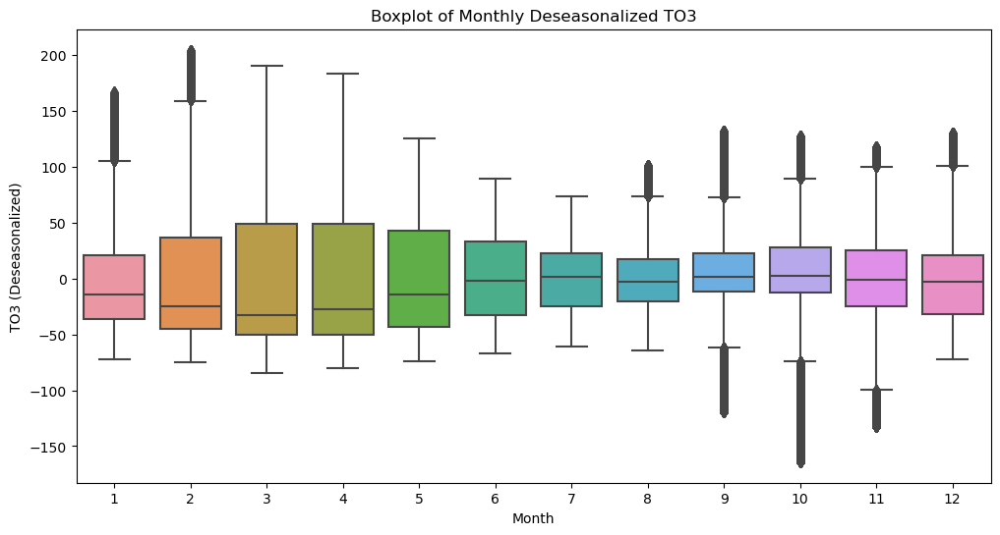

In [24]:
# Make at least 5 different plots using the dataset.
# 1. Box plot - Seasonal variation from month to month
def plot_monthly_boxplot(variable):
    df = remove_monthly_seasonal_cycle(ds_merra2, variable)
    df['month'] = df.index.month
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='month', y='deseasonalized', data=df)
    plt.title(f'Boxplot of Monthly Deseasonalized {variable}')
    plt.xlabel('Month')
    plt.ylabel(f'{variable} (Deseasonalized)')
    plt.show()
    
plot_monthly_boxplot('TO3')

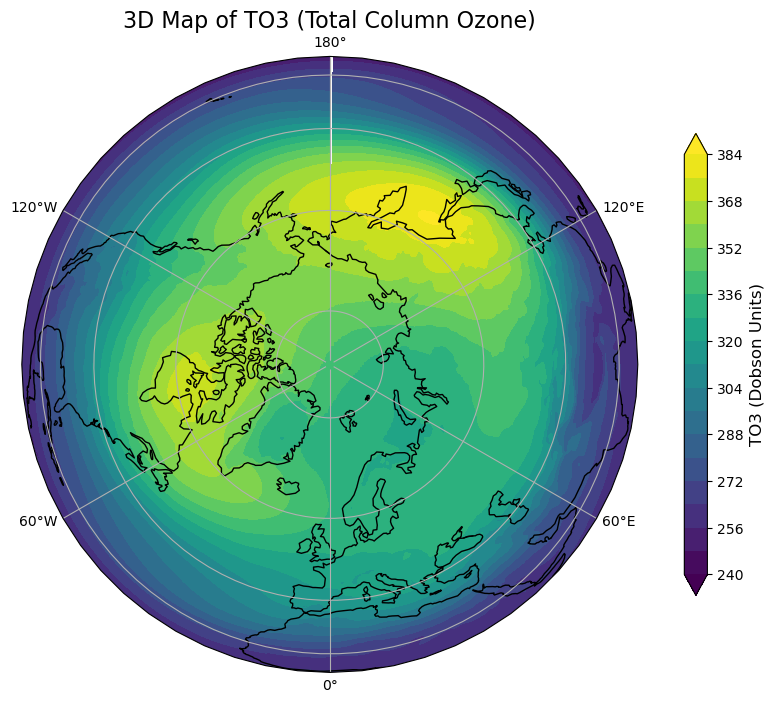

In [25]:
# 2.Stereoscopic map showing TO3 (Total Column Ozone) data
def plot_3d_map(ds_merra2, variable='TO3'):
    
    # Extract TO3 data
    if variable in ds_merra2.variables:
        data = ds_merra2[variable].mean(dim='time').values  # Calculate the mean of the time dimension
    else:
        print(f"Error: '{variable}' data is not available in the dataset.")
        return
    
    # Get latitude and longitude information
    lat = ds_merra2['lat'].values  
    lon = ds_merra2['lon'].values  

    # Create images and projections
    fig = plt.figure(figsize=(12, 8))
    
    # Create Orthographic projections
    ax = fig.add_subplot(111, projection=ccrs.Orthographic(0, 90))  # North Pole perspective

    # Map background
    ax.coastlines()
    ax.set_title('3D Map of TO3 (Total Column Ozone)', fontsize=16)

    # Plot the distribution of TO3 data
    im = ax.contourf(lon, lat, data, 20, cmap='viridis', transform=ccrs.PlateCarree(), extend='both')
    
    # Add color bar
    cbar = fig.colorbar(im, ax=ax, orientation='vertical', shrink=0.75)
    cbar.set_label('TO3 (Dobson Units)', fontsize=12)

    ax.gridlines(draw_labels=True)  # Display gridlines
    plt.show()

plot_3d_map(ds_merra2)

In [31]:
# 3. Interactive graphics - use hvplot
def plot_interactive(variable):
    # Gets the xarray data set
    data = ds_merra2[variable]
    
    # Plot an interactive line plot using hvplot
    df_hv = data.hvplot.line(x='time', y=variable, title=f'Deseasonalized {variable}')
    
    # Sets the size of the graph
    df_hv.opts(width=800, height=400)
    return df_hv

plot_interactive('TO3')

# If the picture does not appear please view the pdf version

:DynamicMap   [lat,lon]
   :Curve   [time]   (total_column_ozone)

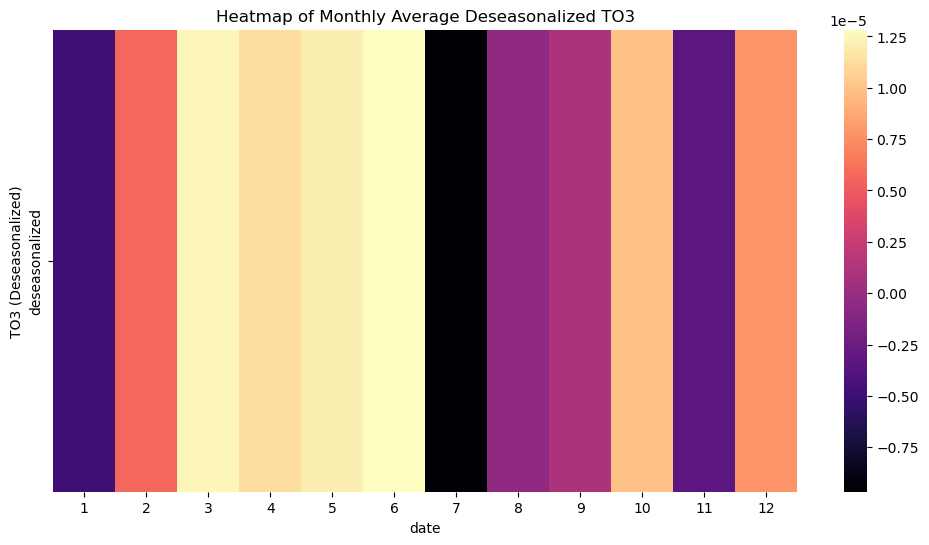

In [27]:
# 4. Heat map - A heat map of monthly averages
def plot_heatmap(variable):
    df = remove_monthly_seasonal_cycle(ds_merra2, variable)
    monthly_avg = df.groupby(df.index.month).mean()
    
    plt.figure(figsize=(12, 6))
    sns.heatmap(monthly_avg[['deseasonalized']].T, cmap='magma')
    plt.title(f'Heatmap of Monthly Average Deseasonalized {variable}')
    plt.ylabel(f'{variable} (Deseasonalized)')
    plt.show()

plot_heatmap('TO3')

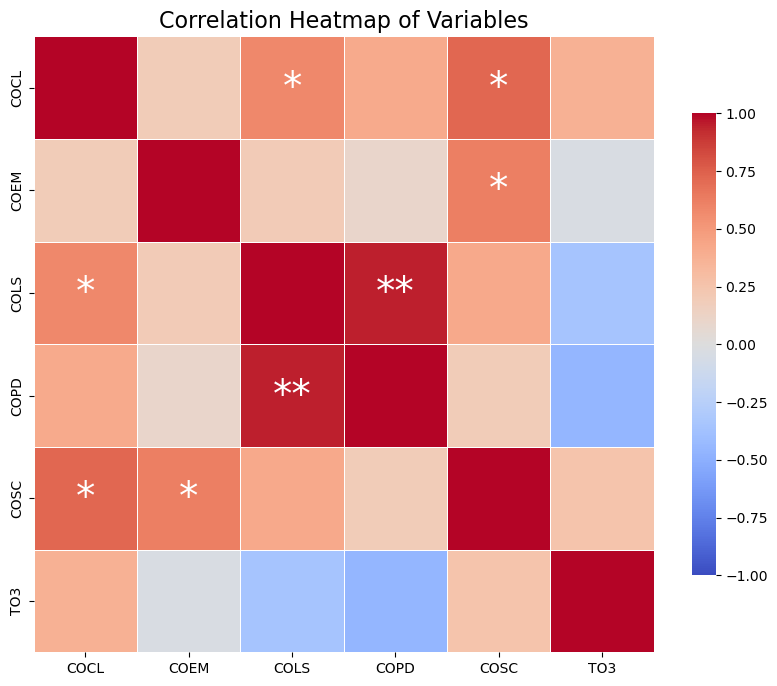

In [28]:
# 5. Draw a heat map of the correlation between the six variables
def plot_correlation_heatmap(variables):
    # Extract the data for each variable and calculate the mean of the time dimension
    data_dict = {}
    for variable in variables:
        # Gets the time dimension average for each variable
        data = ds_merra2[variable].mean(dim='time').values
        # If necessary, flatten the data to a 1D array
        data_dict[variable] = data.flatten()  # Flatten the data into one dimension

    # Convert the data to a DataFrame
    df = pd.DataFrame(data_dict)
    
    # Computed correlation matrix
    corr_matrix = df.corr()
    # Calculate the p-value matrix
    p_value_matrix = pd.DataFrame(index=variables, columns=variables)
    for i in range(len(variables)):
        for j in range(len(variables)):
            if i != j:  # Avoid calculating diagonals
                _, p_value = pearsonr(df[variables[i]], df[variables[j]])
                p_value_matrix.iloc[i, j] = p_value
            else:
                p_value_matrix.iloc[i, j] = 1  # The p-value on the diagonal is 1 (no need to calculate)

    # plot
    plt.figure(figsize=(10, 8))
    ax = sns.heatmap(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5, fmt='.2f', 
                     cbar_kws={'shrink': 0.75})

    # Add salience to the heat map
    for i in range(len(variables)):
        for j in range(len(variables)):
            r = corr_matrix.iloc[i, j]
            p_value = p_value_matrix.iloc[i, j]
            
            # Significance judgment: If p-value < 0.05, it means significant
            if p_value < 0.05 and i != j:  # Eliminate the diagonal
                if abs(r) > 0.8:
                    ax.text(j + 0.5, i + 0.5, '**', ha='center', va='center', color='white', fontsize=28)
                elif 0.5 < abs(r) <= 0.8:
                    ax.text(j + 0.5, i + 0.5, '*', ha='center', va='center', color='white', fontsize=28)

    # Set the title and label
    plt.title('Correlation Heatmap of Variables', fontsize=16)
    plt.show()

# A list of variables for which correlations need to be drawn
variables = ['COCL', 'COEM', 'COLS', 'COPD', 'COSC', 'TO3']
plot_correlation_heatmap(variables)

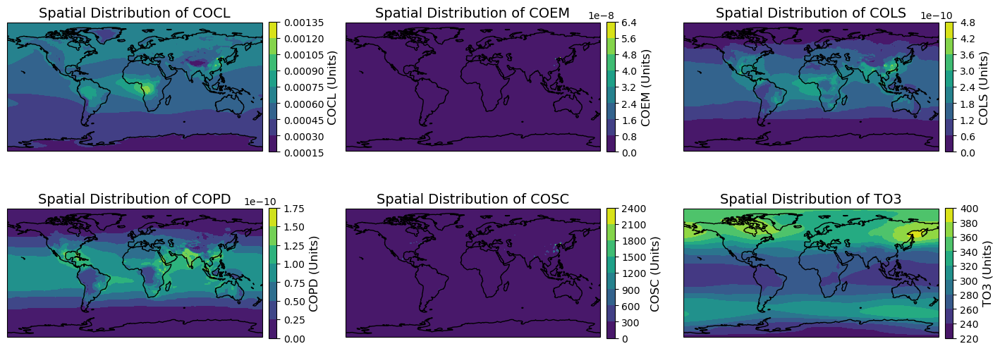

In [29]:
# 6. Spatial distribution of six variables
def plot_spatial_distribution(variables):
    # Create a large graph with multiple subgraphs
    fig, axes = plt.subplots(2, 3, figsize=(18, 12), subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.flatten()  # Expands a two-dimensional array to one dimension for easy indexing

    for i, variable in enumerate(variables):
        ax = axes[i]  # Gets the current subgraph
        data = ds_merra2[variable]  # Gets the data for the current variable
        lat = ds_merra2['lat']
        lon = ds_merra2['lon']
        
        # Plot spatial distribution
        data_mean = data.mean(dim='time')  # Average in time dimension
        im = ax.contourf(lon, lat, data_mean, cmap='viridis', transform=ccrs.PlateCarree())
        
        # Set map title
        ax.set_title(f'Spatial Distribution of {variable}', fontsize=14)
        
        # Add map elements
        ax.coastlines()
        
        # Add a color bar and resize the color bar
        cbar = fig.colorbar(im, ax=ax, orientation='vertical', shrink=0.28, aspect=16, pad=0.02)
        cbar.set_label(f'{variable} (Units)', fontsize=12)

    plt.subplots_adjust(hspace=-0.6, wspace=0.1)  # hspace: Upper and lower spacing, wspace: left and right spacing
    plt.show()

# List of variables to draw
variables = ['COCL', 'COEM', 'COLS', 'COPD', 'COSC', 'TO3']
plot_spatial_distribution(variables)

In [32]:
# 7. Interactive mapping of data sets
# Set variable
variables1 = ['TO3', 'COEM', 'COCL', 'COLS', 'COPD', 'COSC']

# The six variables are extracted from the xarray dataset and the mean of the time dimension is selected
df = ds_merra2[variables1].mean(dim='time').to_dataframe().reset_index()

# Create an interactive interface using hvplot explorer
hvexplorer = df.hvplot.explorer() # For performance reasons, only 100,000 rows of data were randomly selected to plot, if you want to plot more data points without relying on sampling, you can enable rasterize=True or datashade=True.
hvexplorer

# If the picture does not appear please view the pdf version

hvDataFrameExplorer(advanced=Advanced(explorer=..., name='Advanced00999', opts=None), axes=Axes(explorer=..., height=None, legend='bottom_right', logx=False, logy=False, name='Axes00993', responsive=True, shared_axes=True, width=None, xlim=None, ylim=None), by=[], code="df.hvplot(\n    kind='scatter',\n    x='index',\n    legend='bottom_right',\n    widget_location='bottom',\n)", colormapping=Colormapping(clim=None, cmap='kbc_r', cnorm='linear', color=None, colorbar=None, explorer=..., name='Colormapping00994', rescale_discrete_levels=True, symmetric=False), geographic=Geographic(crs=None, crs_kwargs={}, explorer=..., feature_scale='110m', features=None, geo=False, global_extent=None, name='Geographic00996', project=False, projection=None, projection_kwargs={}, tiles=None), groupby=[], kind='scatter', labels=Labels(clabel='', explorer=..., fontscale=1, name='Labels00995', rot=0, title='', xlabel='', ylabel=''), name='hvDataFrameExplorer00971', operations=Operations(aggregator=None, datashade=False, dynspread=False, explorer=..., name='Operations00997', rasterize=False, x_sampling=None, y_sampling=None), statusbar=StatusBar(live_update=True, name='StatusBar00986'), style=Style(alpha=1, explorer=..., name='Style00998'), x='index', y='lat', y_multi=[], z=None)